`cd project/seniorthesis/notebooks`

`conda list PyCO2SYS`

`pip install PyCO2SYS`

`pip install git+https://github.com/jbusecke/cmip6_preprocessing.git`

`mv *.png ../figures`

In [1]:
import xarray as xr
import xesmf as xe
from cmip6_preprocessing.preprocessing import combined_preprocessing
import PyCO2SYS as pyco2 # i have to install this package through terminal for it to work
import intake
import matplotlib.pyplot as plt
import numpy as np
import warnings
import gsw
from cmip6_preprocessing.postprocessing import combine_datasets
from cartopy import crs as ccrs
import cartopy.feature as cfeature
from cartopy.util import add_cyclic_point
import cmocean
import matplotlib.path as mpath
from cmip6_preprocessing.postprocessing import combine_datasets
from cmip6_preprocessing.postprocessing import merge_variables
from dask.diagnostics import ProgressBar
from xgcm import Grid
from xhistogram.xarray import histogram
import pandas as pd

In [8]:
col = intake.open_esm_datastore("https://storage.googleapis.com/cmip6/pangeo-cmip6.json")

def pick_first_member(ds_list, **kwargs):
    return ds_list[0]

variables = ['dissic','talk', 'so', 'thetao', 'fgco2']
z_kwargs = {'consolidated': True, 'use_cftime': True}
query = dict(experiment_id=['historical'], 
             table_id=['Omon'], 
             variable_id=variables,
             grid_label=['gr'],
              source_id=['GFDL-ESM4', 'CESM2-WACCM', 'CESM2', 
                         'CESM2-FV2', 'MRI-ESM2-0', 
                         'GFDL-CM4', 'CESM2-WACCM-FV2']
            )


cat = col.search(**query)

# print(cat.df['source_id'].unique())
dd_gr = cat.to_dataset_dict(zarr_kwargs=z_kwargs, storage_options={'token': 'anon'},
                                preprocess=combined_preprocessing, aggregate=False)

dd_gr = merge_variables(dd_gr)

temp={}
for name,item in dd_gr.items():
    #print(name)
    #print(item.data_vars)
    present = item.data_vars
    if all(i in present for i in variables):
        #print(name)
        temp[name]=item
dd_gr = temp
# list(dd_new_gr.keys())

dd_gr = combine_datasets(
    dd_gr,
    pick_first_member,
    match_attrs=['source_id', 'grid_label', 'experiment_id', 'table_id']
)
list(dd_gr.keys())
# dd_new_new_gr


--> The keys in the returned dictionary of datasets are constructed as follows:
	'activity_id.institution_id.source_id.experiment_id.member_id.table_id.variable_id.grid_label.zstore.dcpp_init_year.version'


/srv/conda/envs/notebook/lib/python3.8/site-packages/cmip6_preprocessing/postprocessing.py:138: UserWarning: CMIP.NCAR.CESM2-FV2.historical.r3i1p1f1.Omon.gr.none.fgco2 failed to combine with :indexes along dimension 'time' are not equal
  warnings.warn(f"{cmip6_dataset_id(ds)} failed to combine with :{e}")
/srv/conda/envs/notebook/lib/python3.8/site-packages/cmip6_preprocessing/postprocessing.py:138: UserWarning: CMIP.NCAR.CESM2.historical.r10i1p1f1.Omon.gr.none.thetao failed to combine with :indexes along dimension 'time' are not equal
  warnings.warn(f"{cmip6_dataset_id(ds)} failed to combine with :{e}")
/srv/conda/envs/notebook/lib/python3.8/site-packages/cmip6_preprocessing/postprocessing.py:138: UserWarning: CMIP.NCAR.CESM2-FV2.historical.r2i1p1f1.Omon.gr.none.talk failed to combine with :indexes along dimension 'time' are not equal
  warnings.warn(f"{cmip6_dataset_id(ds)} failed to combine with :{e}")
/srv/conda/envs/notebook/lib/python3.8/site-packages/cmip6_preprocessing/postpr

['CESM2.gr.historical.Omon',
 'GFDL-CM4.gr.historical.Omon',
 'CESM2-WACCM.gr.historical.Omon',
 'MRI-ESM2-0.gr.historical.Omon',
 'CESM2-FV2.gr.historical.Omon',
 'GFDL-ESM4.gr.historical.Omon',
 'CESM2-WACCM-FV2.gr.historical.Omon']

In [2]:
dd = {}
dd['UKESM1-0-LL.gn.historical.Omon'] = xr.open_mfdataset('UKESM1_*_20yr.nc')
dd['CanESM5-CanOE.gn.historical.Omon']= xr.open_mfdataset('CanESM5CanOE*_20yr.nc')
dd['CNRM-ESM2-1.gn.historical.Omon']= xr.open_mfdataset('CNRM*_20yr.nc')
dd['CanESM5.gn.historical.Omon']= xr.open_mfdataset('CanESM5_*_20yr.nc')
dd['IPSL-CM6A-LR.gn.historical.Omon']= xr.open_mfdataset('IPSL*_20yr.nc')
dd['CESM2-WACCM.gr.historical.Omon']= xr.open_mfdataset('CESM2-WACCM_*_20yr.nc')
dd['CESM2.gr.historical.Omon']= xr.open_mfdataset('CESM2_*_20yr.nc')
dd['CESM2-WACCM-FV2.gr.historical.Omon']= xr.open_mfdataset('CESM2-WACCM-FV2_*_20yr.nc')
dd['GFDL-ESM4.gr.historical.Omon']= xr.open_mfdataset('GFDL-ESM4_*_20yr.nc')
dd['CESM2-FV2.gr.historical.Omon']= xr.open_mfdataset('CESM2-FV2_*_20yr.nc')
dd['GFDL-CM4.gr.historical.Omon']= xr.open_mfdataset('GFDL-CM4_*_20yr.nc')
dd['MRI-ESM2-0.gr.historical.Omon']= xr.open_mfdataset('MRI-ESM2-0_*_20yr.nc')
A = xr.open_mfdataset('AREA.nc')

In [3]:
for name, ds in dd.items():
    ds['p'] = gsw.p_from_z(-1*ds['lev'], ds['y'], geo_strf_dyn_height=0, sea_surface_geopotential=0)*xr.ones_like(ds['talk']) # expand along time dimension
    ds['insitutemp'] = gsw.t_from_CT(ds['so'], ds['thetao'], ds['p'])
    ds['sigma2'] = gsw.sigma2(ds['so'],ds['thetao'])

In [4]:
dd_x = {}
dd_x['UKESM1-0-LL.gn.historical.Omon'] = xr.open_mfdataset('UKESM1_*_20yr.nc').isel(x=slice(180,200)).mean('x', keep_attrs=True)
dd_x['CanESM5-CanOE.gn.historical.Omon']= xr.open_mfdataset('CanESM5CanOE*_20yr.nc').isel(x=slice(180,200)).mean('x', keep_attrs=True)
dd_x['CNRM-ESM2-1.gn.historical.Omon']= xr.open_mfdataset('CNRM*_20yr.nc').isel(x=slice(180,200)).mean('x', keep_attrs=True)
dd_x['CanESM5.gn.historical.Omon']= xr.open_mfdataset('CanESM5_*_20yr.nc').isel(x=slice(180,200)).mean('x', keep_attrs=True)
dd_x['IPSL-CM6A-LR.gn.historical.Omon']= xr.open_mfdataset('IPSL*_20yr.nc').isel(x=slice(180,200)).mean('x', keep_attrs=True)
dd_x['CESM2-WACCM.gr.historical.Omon']= xr.open_mfdataset('CESM2-WACCM_*_20yr.nc').isel(x=slice(180,200)).mean('x', keep_attrs=True)
dd_x['CESM2.gr.historical.Omon']= xr.open_mfdataset('CESM2_*_20yr.nc').isel(x=slice(180,200)).mean('x', keep_attrs=True)
dd_x['CESM2-WACCM-FV2.gr.historical.Omon']= xr.open_mfdataset('CESM2-WACCM-FV2_*_20yr.nc').isel(x=slice(180,200)).mean('x', keep_attrs=True)
dd_x['GFDL-ESM4.gr.historical.Omon']= xr.open_mfdataset('GFDL-ESM4_*_20yr.nc').isel(x=slice(180,200)).mean('x', keep_attrs=True)
dd_x['CESM2-FV2.gr.historical.Omon']= xr.open_mfdataset('CESM2-FV2_*_20yr.nc').isel(x=slice(180,200)).mean('x', keep_attrs=True)
dd_x['GFDL-CM4.gr.historical.Omon']= xr.open_mfdataset('GFDL-CM4_*_20yr.nc').isel(x=slice(180,200)).mean('x', keep_attrs=True)
dd_x['MRI-ESM2-0.gr.historical.Omon']= xr.open_mfdataset('MRI-ESM2-0_*_20yr.nc').isel(x=slice(180,200)).mean('x', keep_attrs=True)

In [5]:
for name, ds in dd_x.items():
    da = dd[name]
    ds['p'] = gsw.p_from_z(-1*ds['lev'], ds['y'], geo_strf_dyn_height=0, sea_surface_geopotential=0)*xr.ones_like(ds['talk']) # expand along time dimension
    ds['insitutemp'] = gsw.t_from_CT(da['so'], da['thetao'], ds['p']).isel(x=slice(180,200)).mean('x', keep_attrs=True)
    ds['sigma2'] = gsw.sigma2(da['so'],da['thetao']).isel(x=slice(180,200)).mean('x', keep_attrs=True)

In [6]:
# np.where(ppco2[:,0:60] == ppco2[:,0:60].max())
# ppco2[25,59]

PCO2_x = {}
PCO2_max = {}
PCO2_max_where = {}
fgco2_max = {}
fgco2_max_where = {}

for name, ds in dd_x.items():
    conversion =  1e6/1035
    results = pyco2.sys(par1=ds['talk']*conversion,par2=ds['dissic']*conversion,par1_type=1,par2_type=2,
                        pressure_out=0, temperature_out = ds['thetao'], pressure = ds['p'], 
                        temperature = ds['insitutemp'])
    PCO2_x[name] = results['pCO2_out']
    ppco2 = ds.dissic.copy(data=results['pCO2_out'])
    PCO2_max[name] = ppco2[:,0:60].max()
    PCO2_max_where[name] = np.where(ppco2[:,0:60] == ppco2[:,0:60].max())
    fgco2_max[name] = ds.fgco2[0:60].max()
    fgco2_max_where[name] = np.where(ds.fgco2[0:60] == ds.fgco2[0:60].max())

/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.

In [54]:
# Pmax = {}
# Fmax = {}
# for name, ds in dd_x.items():
#       Pmax[name] = PCO2_x[name].max()
# Pmax

# PCO2_max_where
# fgco2_max_where
PCO2_max

{'UKESM1-0-LL.gn.historical.Omon': <xarray.DataArray 'dissic' ()>
 array(496.01737189),
 'CanESM5-CanOE.gn.historical.Omon': <xarray.DataArray 'dissic' ()>
 array(602.40445141),
 'CNRM-ESM2-1.gn.historical.Omon': <xarray.DataArray 'dissic' ()>
 array(793.169745),
 'CanESM5.gn.historical.Omon': <xarray.DataArray 'dissic' ()>
 array(673.70191939),
 'IPSL-CM6A-LR.gn.historical.Omon': <xarray.DataArray 'dissic' ()>
 array(716.6471206),
 'CESM2-WACCM.gr.historical.Omon': <xarray.DataArray 'dissic' ()>
 array(644.99928497),
 'CESM2.gr.historical.Omon': <xarray.DataArray 'dissic' ()>
 array(767.07943912),
 'CESM2-WACCM-FV2.gr.historical.Omon': <xarray.DataArray 'dissic' ()>
 array(733.28536606),
 'GFDL-ESM4.gr.historical.Omon': <xarray.DataArray 'dissic' ()>
 array(565.15979347),
 'CESM2-FV2.gr.historical.Omon': <xarray.DataArray 'dissic' ()>
 array(668.11834095),
 'GFDL-CM4.gr.historical.Omon': <xarray.DataArray 'dissic' ()>
 array(550.91876683),
 'MRI-ESM2-0.gr.historical.Omon': <xarray.Dat

# Diff between PCO2 calculated with time average before and time average after

<ipython-input-12-097e46d5bee8>:12: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im = ax.pcolormesh(ds['y'],ds['lev'],results['pCO2_out']-PCO2_x[name], cmap = 'RdBu_r')
<ipython-input-12-097e46d5bee8>:12: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im = ax.pcolormesh(ds['y'],ds['lev'],results['pCO2_out']-PCO2_x[name], cmap = 'RdBu_r')
<ipython-input-12-097e46d5bee8>:12: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as 

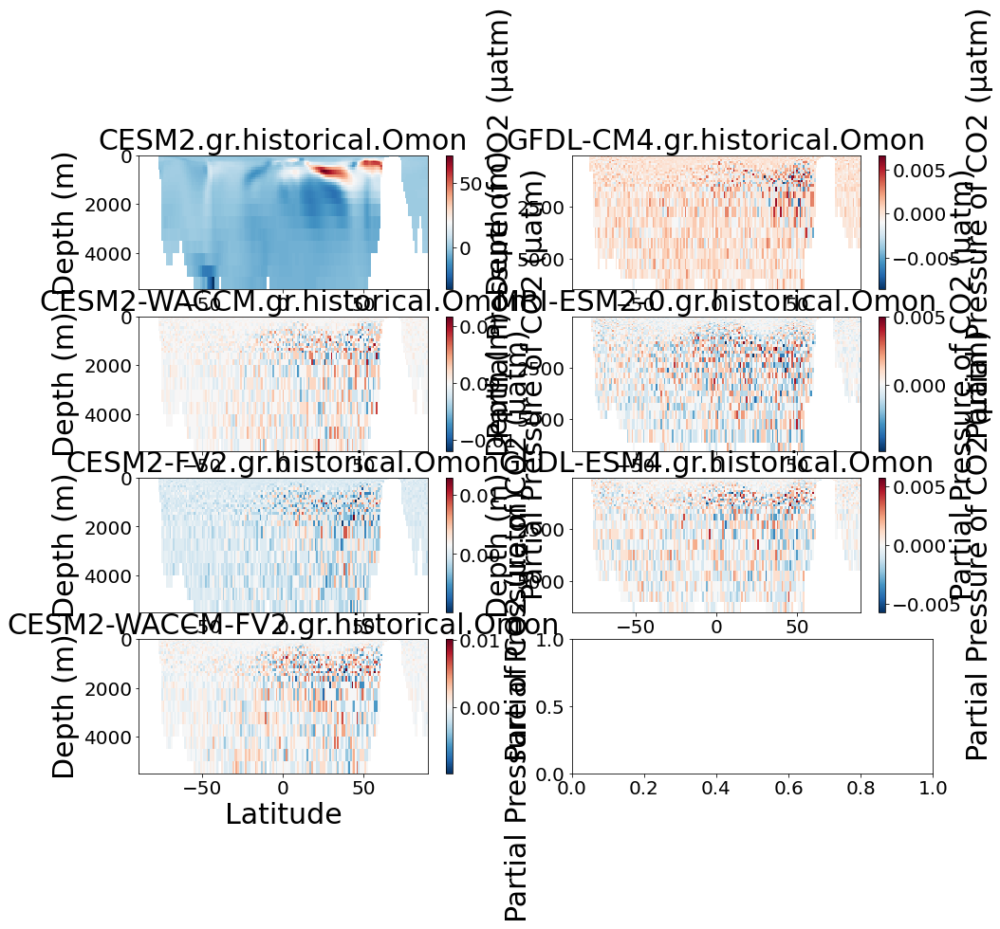

In [12]:
fig, axarr = plt.subplots(nrows = 4, ncols = 2, figsize=[15,12])
ax_idx = 0
for name, ds in dd_gr.items():
    ax = axarr.flat[ax_idx]
    ds = ds.isel(time=slice(0, 239)).sel(x=slice(180,200)).mean(['time', 'x'],keep_attrs=True)
    ds['p'] = gsw.p_from_z(-1*ds['lev'], ds['y'], geo_strf_dyn_height=0, sea_surface_geopotential=0)*xr.ones_like(ds['talk'])
    ds['insitutemp'] = gsw.t_from_CT(da['so'], da['thetao'], ds['p']).isel(x=slice(180,200)).mean('x', keep_attrs=True)
    conversion =  1e6/1035
    results = pyco2.sys(par1=ds['talk']*conversion,par2=ds['dissic']*conversion,par1_type=1,par2_type=2,
                        pressure_out=0, temperature_out = ds['thetao'], pressure = ds['p'], 
                        temperature = ds['insitutemp'])
    im = ax.pcolormesh(ds['y'],ds['lev'],results['pCO2_out']-PCO2_x[name], cmap = 'RdBu_r')
    cbar = plt.colorbar(im,ax=ax)
    ax.invert_yaxis()
    cbar.set_label('Partial Pressure of CO2 (\u03BCatm)')
    ax.set_title(name)
    ax.set_xlabel('Latitude')
    ax.set_ylabel('Depth (m)')
    ax_idx += 1

# FgCO2 lineplot
Averaged over 1850 to 1870

averaged zonally

added `skipna = True` to `ds.fgco2.mean(['x'], keep_attrs=True, skipna = True`

changed the conversion to be in molC instead of molCO2

Notably, there are no more *crazy* outliers

/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.

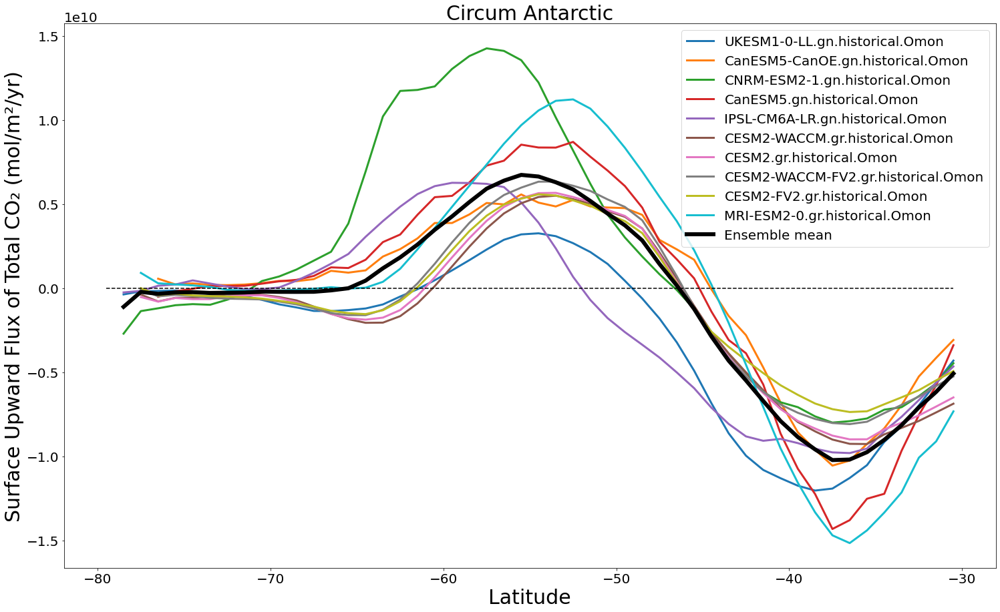

In [9]:
# fig, ax = plt.subplots(nrows = 1, figsize=[18,12])
plt.rc('font', size = 20)
plt.rc('axes', titlesize= 30)    
plt.rc('axes', labelsize= 30)
plt.rc('figure', titlesize=30)
temp={}
maxi={}
yy = dd['CESM2-FV2.gr.historical.Omon'].lat.y

conversion = 3.1536e7 * 83.3
# 3.1536e7 seconds per year
# 83.3 mol C per kg -- 12 gC/mol

ax_idx = 0
for name, ds in dd.items():
    # maybe do mean over the entire circumference so just 
    # take out the where function and mean all x
    if name != 'GFDL-CM4.gr.historical.Omon':
        if name != 'GFDL-ESM4.gr.historical.Omon':
            ar = -1*(ds.fgco2*A.areacello*conversion).mean(['x'], keep_attrs = True,skipna = True)

            plt.plot(yy[10:60], ar[10:60], label = name, lw = 3)

            temp[name] = ar
            maxi[name] = ar[0:60].max()



mn = np.nanmean(list(temp.values()), axis=0)
# sd = np.std(list(temp.values()), axis=0)
plt.plot(yy[10:60], mn[10:60], lw = 6, label = 'Ensemble mean', color = 'black')
plt.xlabel('Latitude')
plt.ylabel('Surface Upward Flux of Total CO\u2082 (molC/m\u00b2/yr)')

zr = xr.zeros_like(dd['CESM2-FV2.gr.historical.Omon'].fgco2)
zr.isel(x = 0)[10:60].plot(linestyle = 'dashed', color = 'black')
plt.xlabel('Latitude')
plt.ylabel('Surface Upward Flux of Total CO\u2082 (mol/m\u00b2/yr)')
# ax = plt.gca
# box = ax.get_position()
# ax.position([box.x0, box.y0, box.width * 0.8, box.height])
plt.legend(
#     bbox_to_anchor=(1.05, 1), 
    loc='upper right'
#     , borderaxespad=0.
)
plt.title('Circum Antarctic')
plt.rcParams["figure.figsize"] = (25,15)



### fgco2 max

'CESM2-FV2.gr.historical.Omon': 5.58703627e+09

'CESM2-WACCM-FV2.gr.historical.Omon': 6.34411639e+09

'CESM2-WACCM.gr.historical.Omon': 5.50452654e+09

'CESM2.gr.historical.Omon': 5.67236407e+09

'CNRM-ESM2-1.gn.historical.Omon': 1.42627528e+10

'CanESM5-CanOE.gn.historical.Omon': 5.57807807e+09

'CanESM5.gn.historical.Omon': 8.70143271e+09

'GFDL-CM4.gr.historical.Omon': 7.04884087e+09

'GFDL-ESM4.gr.historical.Omon': 4.48259868e+09

'IPSL-CM6A-LR.gn.historical.Omon': 6.27058563e+09

'MRI-ESM2-0.gr.historical.Omon': 1.12286518e+10

'UKESM1-0-LL.gn.historical.Omon': 3.26750615e+09

### PCO2 max

'CESM2-FV2.gr.historical.Omon': 668.11834095

'CESM2-WACCM-FV2.gr.historical.Omon': 733.28536606

'CESM2-WACCM.gr.historical.Omon': 644.99928497

'CESM2.gr.historical.Omon': 767.07943912

'CNRM-ESM2-1.gn.historical.Omon': 793.169745

'CanESM5-CanOE.gn.historical.Omon': 602.40445141

'CanESM5.gn.historical.Omon': 673.70191939

'GFDL-CM4.gr.historical.Omon': 550.91876683

'GFDL-ESM4.gr.historical.Omon': 565.15979347

'IPSL-CM6A-LR.gn.historical.Omon': 716.6471206

'MRI-ESM2-0.gr.historical.Omon': 651.62504608

'UKESM1-0-LL.gn.historical.Omon': 496.01737189

slope: 1.6167724401816354e-08
int: 542.1558829853932


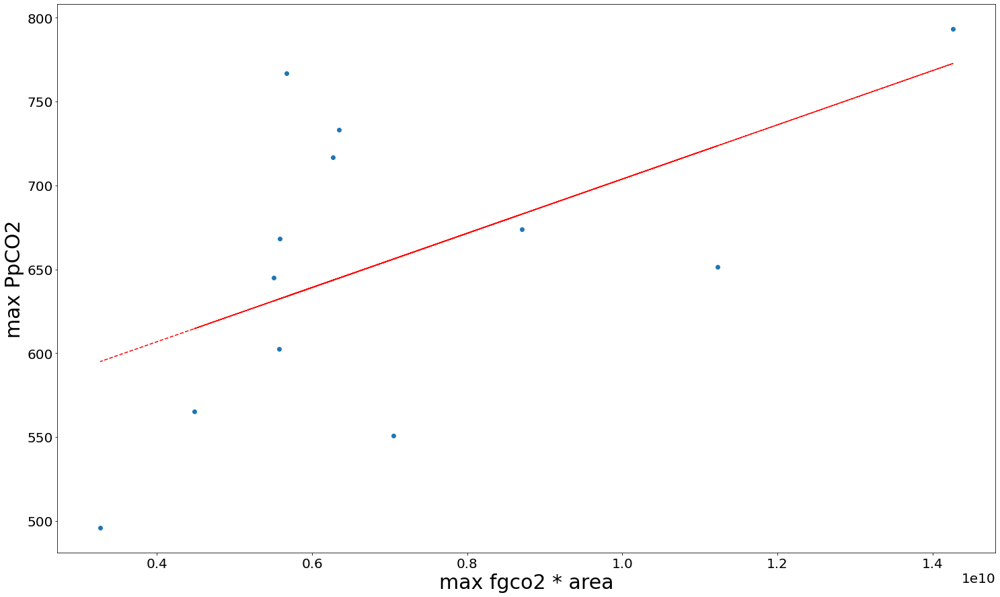

In [78]:
p = [668.11834095, 733.28536606, 644.99928497, 767.07943912, 793.169745, 602.40445141, 
 673.70191939, 550.91876683, 565.15979347, 716.6471206, 651.62504608, 496.01737189]
f = [5.58703627e+09, 6.34411639e+09, 5.50452654e+09, 5.67236407e+09, 1.42627528e+10, 5.57807807e+09,
    8.70143271e+09, 7.04884087e+09, 4.48259868e+09, 6.27058563e+09, 1.12286518e+10, 3.26750615e+09]
plt.scatter(f, p)
plt.xlabel('max fgco2 * area')
plt.ylabel('max PpCO2')



# calc the trendline
z = np.polyfit(f, p, 1)
pp = np.poly1d(z)
plt.plot(f,pp(f),"r--")
# the line equation:
# print("y=%.6fx+(%.6f)"%(z[0],z[1]))
print('slope: ' +  str(z[0]) )
print('int: ' + str(z[1]))

In [101]:
# np.nansum(list(temp.values()), axis=0)
s = (temp['CESM2-FV2.gr.historical.Omon'] + temp['CESM2-WACCM-FV2.gr.historical.Omon'] +
    temp['CESM2-WACCM.gr.historical.Omon'] 
      + temp['CESM2.gr.historical.Omon']  
     + temp['CNRM-ESM2-1.gn.historical.Omon'] 
     +   temp['CanESM5-CanOE.gn.historical.Omon'] 
     + temp['CanESM5.gn.historical.Omon']  
         + temp['GFDL-CM4.gr.historical.Omon'] 
#      + temp['GFDL-ESM4.gr.historical.Omon'] + temp['IPSL-CM6A-LR.gn.historical.Omon']  
#        +  temp['MRI-ESM2-0.gr.historical.Omon'] + temp['UKESM1-0-LL.gn.historical.Omon']
    )
np.any(A.areacello.mean(['x'], keep_attrs = True,skipna = True))

<xarray.DataArray 'areacello' ()>
dask.array<any-aggregate, shape=(), dtype=bool, chunksize=(), chunktype=numpy.ndarray>


In [14]:
a = dd['GFDL-CM4.gr.historical.Omon'].fgco2.mean(['x'], keep_attrs = True,skipna = True)*conversion
# woo2 = woo[10:60]*A.areacello.mean(['x'], keep_attrs = True,skipna = True)[10:60]
# # woo2.plot()
# # woo[10:60].y
b = A.areacello.mean(['x'], keep_attrs = True,skipna = True)
# # woo*A.areacello.mean(['x'], keep_attrs = True,skipna = True).fillna(0)
c = a*b
c.y

<xarray.DataArray 'y' (y: 162)>
array([-89.5, -88.5, -87.5, -86.5, -85.5, -84.5, -83.5, -82.5, -81.5, -80.5,
       -79.5, -78.5, -77.5, -76.5, -75.5, -74.5, -73.5, -72.5, -71.5, -70.5,
       -69.5, -68.5, -67.5, -66.5, -65.5, -64.5, -60.5, -59.5, -58.5, -57.5,
       -56.5, -55.5, -54.5, -53.5, -51.5, -50.5, -49.5, -48.5, -47.5, -46.5,
       -45.5, -44.5, -43.5, -42.5, -41.5, -40.5, -39.5, -38.5, -37.5, -36.5,
       -35.5, -34.5, -33.5, -32.5, -31.5, -30.5, -27.5, -26.5, -25.5, -24.5,
       -23.5, -22.5, -21.5, -20.5, -19.5, -18.5, -17.5, -16.5, -15.5, -13.5,
       -12.5, -11.5, -10.5,  -9.5,  -8.5,  -6.5,  -5.5,  -4.5,  -3.5,  -2.5,
        -0.5,   0.5,   2.5,   3.5,   4.5,   5.5,   6.5,   8.5,   9.5,  10.5,
        11.5,  12.5,  13.5,  15.5,  16.5,  17.5,  18.5,  19.5,  20.5,  21.5,
        22.5,  23.5,  24.5,  25.5,  26.5,  27.5,  30.5,  31.5,  32.5,  33.5,
        34.5,  35.5,  36.5,  37.5,  38.5,  39.5,  40.5,  41.5,  42.5,  43.5,
        44.5,  45.5,  46.5,  47.5,  48.5,  49.5,  50.5,  51.5,  53.5,  54.5,
        55.5,  56.5,  57.5,  58.5,  59.5,  60.5,  64.5,  65.5,  66.5,  67.5,
        68.5,  69.5,  70.5,  71.5,  72.5,  73.5,  74.5,  75.5,  76.5,  77.5,
        78.5,  79.5,  80.5,  81.5,  82.5,  83.5,  84.5,  85.5,  86.5,  87.5,
        88.5,  89.5])
Coordinates:
  * y        (y) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
Attributes:
    axis:           Y
    bounds:         lat_bnds
    cell_methods:   time: point
    long_name:      latitude
    standard_name:  latitude
    units:          degrees_N

Text(0, 0.5, 'Surface Upward Flux of Total CO₂ (mol/m²/yr)')

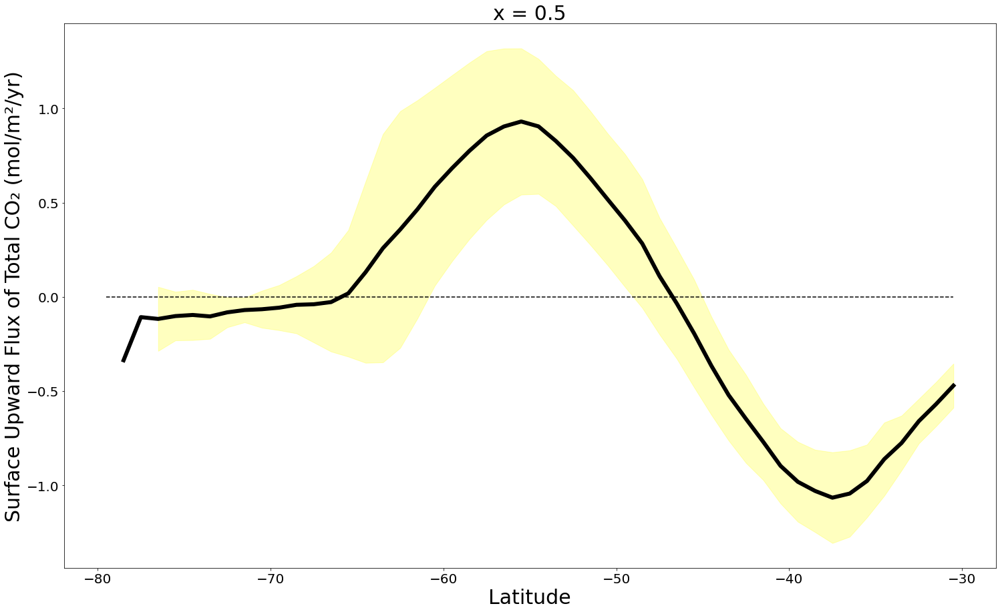

In [13]:
plt.plot(yy[10:60], mn[10:60], lw = 6, label = 'Ensemble mean', color = 'black')
# plt.plot(yy[0:50], mn[0:50]+sd[0:50], lw = 6, label = 'Ensemble mean', color = 'black')
# plt.plot(yy[0:50], mn[0:50]-sd[0:50], lw = 6, label = 'Ensemble mean', color = 'black')
plt.fill_between(yy[10:60], mn[10:60]+sd[10:60], mn[10:60]-sd[10:60], color = 'yellow', alpha = 0.25)

zr = xr.zeros_like(dd['CESM2-FV2.gr.historical.Omon'].fgco2)
zr.isel(x = 0)[10:60].plot(linestyle = 'dashed', color = 'black')
plt.xlabel('Latitude')
plt.ylabel('Surface Upward Flux of Total CO\u2082 (mol/m\u00b2/yr)')

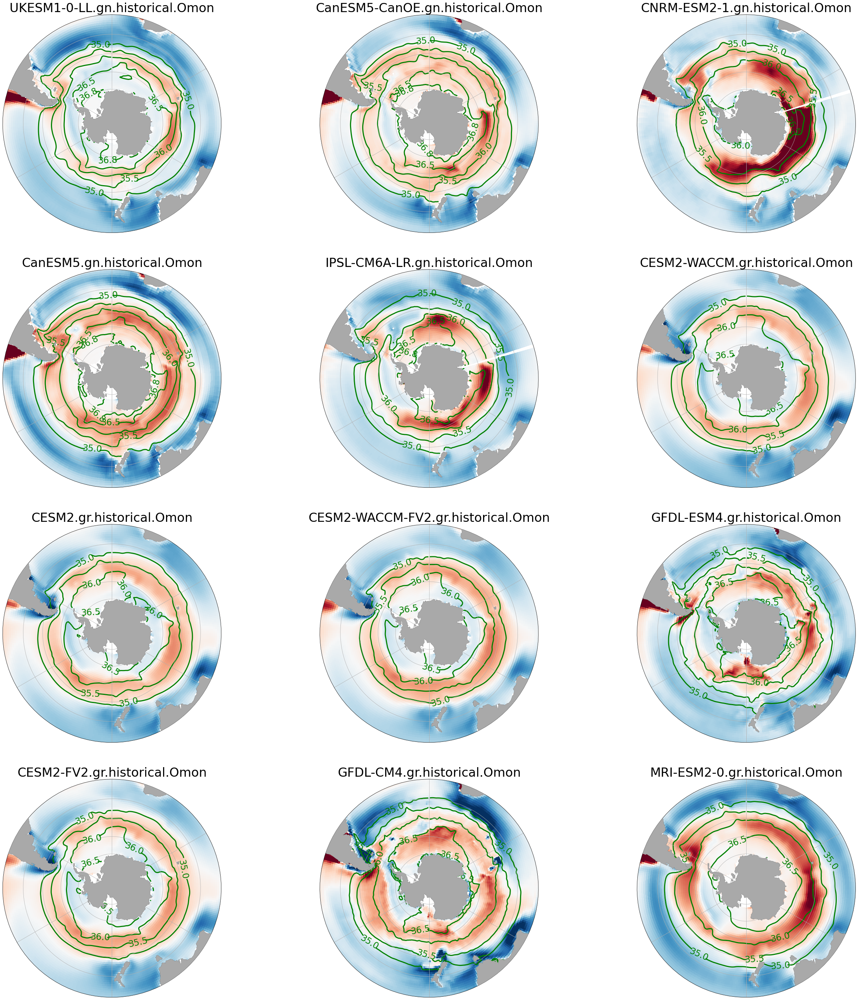

In [104]:
fig, axarr = plt.subplots(nrows = 4, ncols=3, figsize=[40,40], subplot_kw={'projection':ccrs.SouthPolarStereo()})
fig.tight_layout(pad = 5)
crs_plot = ccrs.SouthPolarStereo()
crs_source = ccrs.PlateCarree()

ax_idx = 0 # index for your axes array
for name, ds in dd.items():

    ax = axarr.flat[ax_idx]
    #fig,ax = plt.subplots(figsize=(10,10),subplot_kw={'projection':crs_plot})
    ax.add_feature(cfeature.LAND,zorder=10,facecolor='darkgray')
    ax.set_extent([-180, 180, -90, -30], crs_source)
    # Compute a circle in axes coordinates, which we can use as a boundary
    # for the map. We can pan/zoom as much as we like - the boundary will be
    # permanently circular.
    
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    
    ax.gridlines()
    ax.coastlines()
    
    title=name
    ax.set_title(title,fontsize=34,pad = 1)
    
    lat = ds['fgco2'].lat.transpose('y','x')
    lon = ds['fgco2'].lon.transpose('y','x')
    X = lon
    Y = lat
    
    conversion = 3.1536e7 * 83.3
    # 3.1536e7 seconds per year
    # 83.3 mol C per kg -- 12 gC/mol
    
    Z = ds['fgco2']*conversion
    rho = ds['sigma2'].isel(lev = 0)
    rho = rho.transpose('x','y')
#     rho.assign_coords({'lat': Y})
#     rho.assign_coords({'lon': X})
#     rho = rho.transpose('x','y')
#     rho.assign_coords({'lat': Y})
#     rho.assign_coords({'lon': X})
# #     rho = rho.transpose('y','x')
# #     print(Z)
# #     print(rho)
    
    
    im = ax.pcolormesh(X,Y,-1*Z,cmap='RdBu_r', transform = crs_source, shading = 'auto', vmin = -3, vmax = 3)
    if name == 'UKESM1-0-LL.gn.historical.Omon' or name =='CanESM5-CanOE.gn.historical.Omon' or name =='CNRM-ESM2-1.gn.historical.Omon' or name == 'CanESM5.gn.historical.Omon' or name == 'IPSL-CM6A-LR.gn.historical.Omon':
        CS = ax.contour(rho.lon,rho.lat,rho,transform=crs_source,levels=[35, 35.5, 36, 36.5, 36.8],colors='g', linewidths = 3)
    else:
        CS = ax.contour(rho.lon.transpose('y','x'),rho.lat.transpose('y','x'),rho.transpose('y','x'),transform=crs_source,levels=[35, 35.5, 36, 36.5],colors='g', linewidths = 3)
    
#     cbar_label = 'Surface Upward Flux of Total CO\u2082 (mol/m\u00b2/yr)'
#     cbar = plt.colorbar(im,ax = ax, orientation='horizontal',fraction = 0.05, pad=0.05)
#     cbar.set_label(cbar_label, fontsize = 20)
#     cbar.ax.tick_params(labelsize=18)
    ax.clabel(CS, inline=1, fontsize=24)
    
    ax_idx += 1


<a list of 28 text.Text objects>

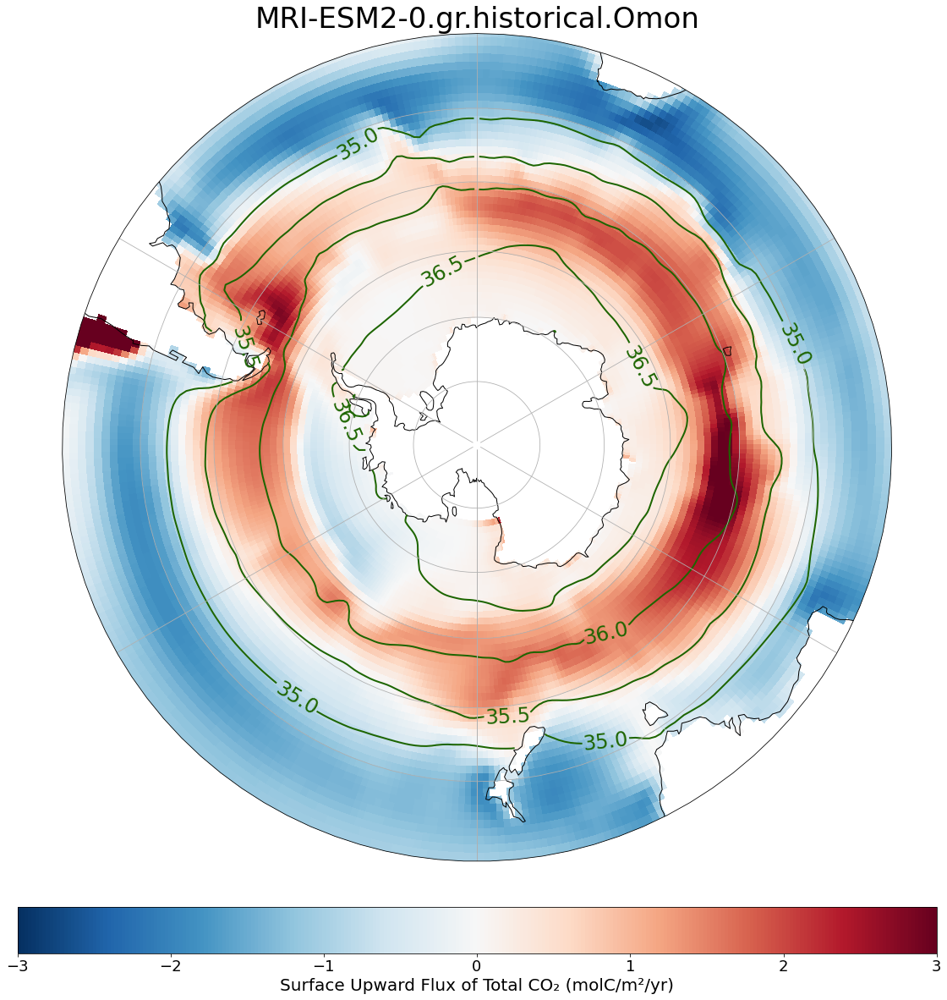

In [11]:
fig, ax = plt.subplots(nrows = 1, ncols=1, figsize=[20,20], subplot_kw={'projection':ccrs.SouthPolarStereo()})
crs_plot = ccrs.SouthPolarStereo()
crs_source = ccrs.PlateCarree()


ax.set_extent([-180, 180, -90, -30], crs_source)

    
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax.set_boundary(circle, transform=ax.transAxes)
    
ax.gridlines()
ax.coastlines()
    
title=name
ax.set_title(title,fontsize=34,pad = 1)
    
lat = ds['fgco2'].lat.transpose('y','x')
lon = ds['fgco2'].lon.transpose('y','x')
X = lon
Y = lat
    
conversion = 3.1536e7 * 83.3
    # 3.1536e7 seconds per year
    # 83.3 mol C per kg -- 12 gC/mol
    
Z = ds['fgco2']*conversion
rho = ds['sigma2'].isel(lev = 0)
rho = rho.transpose('x','y')

    
    
im = ax.pcolormesh(X,Y,-1*Z,cmap='RdBu_r', transform = crs_source, shading = 'auto', vmin = -3, vmax = 3)
if name == 'UKESM1-0-LL.gn.historical.Omon' or name =='CanESM5-CanOE.gn.historical.Omon' or name =='CNRM-ESM2-1.gn.historical.Omon' or name == 'CanESM5.gn.historical.Omon' or name == 'IPSL-CM6A-LR.gn.historical.Omon':
    CS = ax.contour(rho.lon,rho.lat,rho,transform=crs_source,levels=[35, 35.5, 36, 36.5],colors='#1d6500', linewidths = 2)
else:
    CS = ax.contour(rho.lon.transpose('y','x'),rho.lat.transpose('y','x'),rho.transpose('y','x'),transform=crs_source,levels=[35, 35.5, 36, 36.5],colors='#1d6500', linewidths = 2)
    
cbar_label = 'Surface Upward Flux of Total CO\u2082 (molC/m\u00b2/yr)'
cbar = plt.colorbar(im,ax = ax, orientation='horizontal',fraction = 0.05, pad=0.05)
cbar.set_label(cbar_label, fontsize = 20)
cbar.ax.tick_params(labelsize=18)
ax.clabel(CS, inline=1, fontsize=24)
    



# PCO2

<ipython-input-111-fafb6992f9be>:16: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im = ax.pcolormesh(ds['y'],ds['lev'], PCO2_x[name], vmin = 350, vmax = 650)


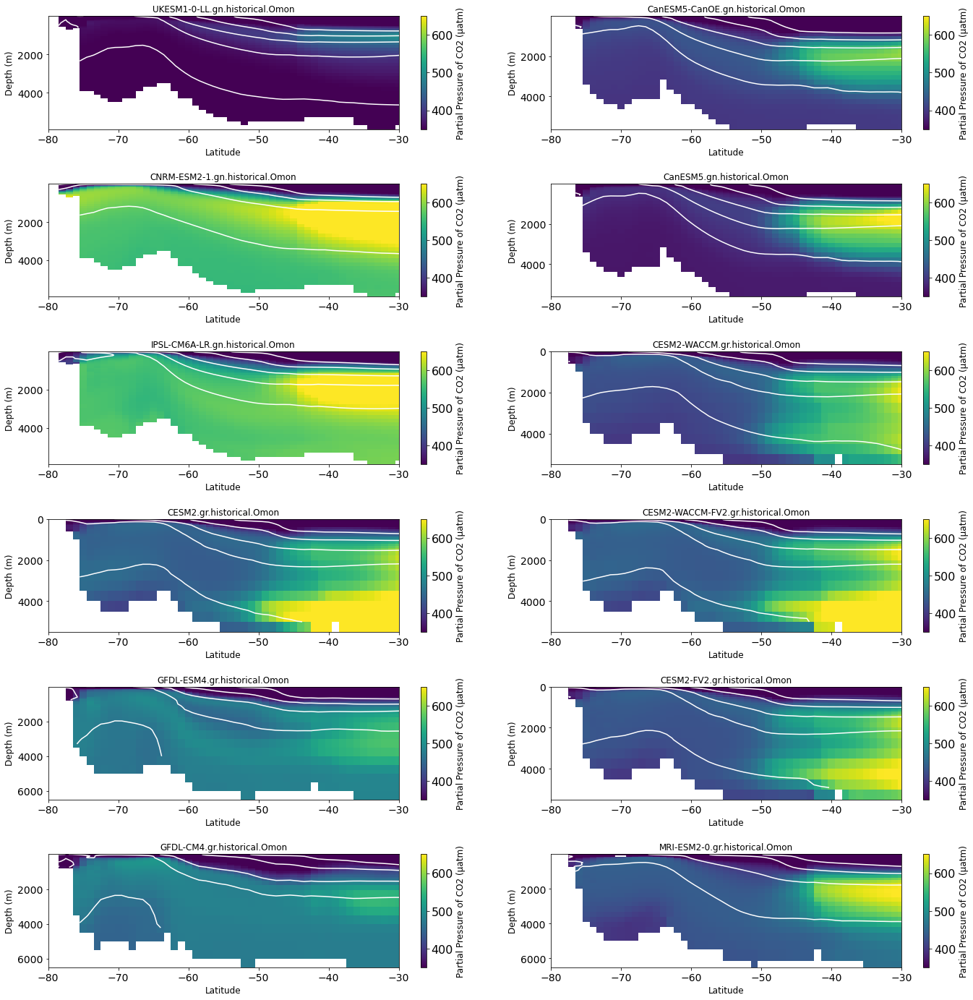

In [111]:
fig, axarr = plt.subplots(nrows = 6, ncols = 2, figsize=[20,20])
fig.tight_layout(pad = 3.5)
plt.rc('font', size = 16)
plt.rc('axes', titlesize= 12)    
plt.rc('axes', labelsize= 12)
plt.rc('figure', titlesize=16)

ax_idx = 0
for name, ds in dd_x.items():
    ax = axarr.flat[ax_idx]
    conversion =  1e6/1035
#     results = pyco2.sys(par1=ds['talk']*conversion,par2=ds['dissic']*conversion,par1_type=1,par2_type=2,
#                         pressure_out=0, temperature_out = ds['thetao'], pressure = ds['p'], 
#                         temperature = ds['insitutemp'])
    ax.set_xlim([-80,-30])
    im = ax.pcolormesh(ds['y'],ds['lev'], PCO2_x[name], vmin = 350, vmax = 650)
    CS = ax.contour(ds['y'],ds['lev'],ds['sigma2'],levels=[35.5, 36, 36.5, 36.8, 37], colors = 'w')
    cbar = plt.colorbar(im,ax=ax)
    ax.invert_yaxis()
    cbar.set_label('Partial Pressure of CO2 (\u03BCatm)')
    ax.set_title(name)
    ax.set_xlabel('Latitude')
    ax.set_ylabel('Depth (m)')
    ax_idx += 1

/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
<ipython-input-14-9e7373cdf921>:31: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im = ax.pcolormesh(ppco2['y'],ppco2['sigma2'], ppco2, vmin = 300, vmax = 650)
/srv/conda/envs/notebook/lib/python3.8/site-packages/dask/array/numpy_compat.py:39: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)
/srv/conda/envs/notebook/lib/python3.8/site-pack

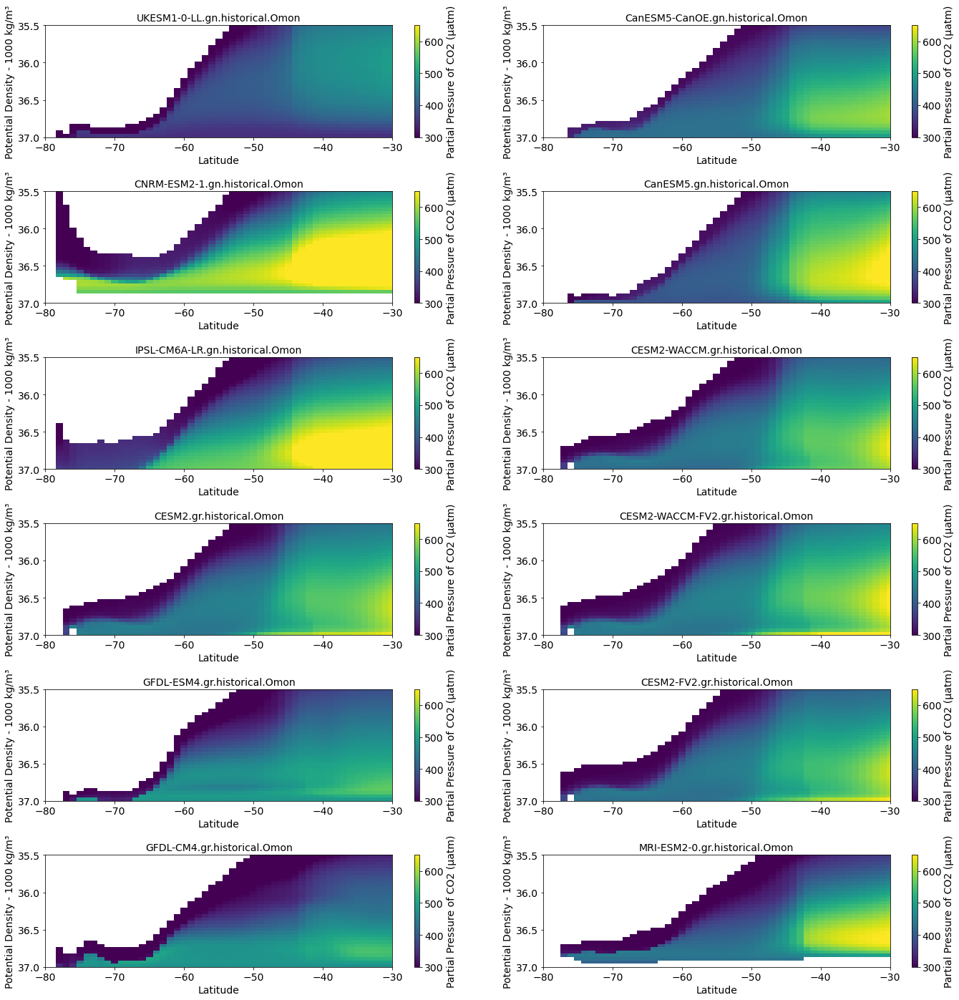

In [14]:
from xgcm import Grid

grid = Grid(ds, coords={'Z': {'center':'lev'}}, periodic=False)
target = np.linspace(35.5, 37, 35)

fig, axarr = plt.subplots(nrows = 6, ncols = 2, figsize=[20,20])
fig.tight_layout(pad = 3.5)
plt.rc('font', size = 14)
plt.rc('axes', titlesize= 14)    
plt.rc('axes', labelsize= 14)
plt.rc('figure', titlesize=16)

ax_idx = 0

for name, ds in dd_x.items():

    ax = axarr.flat[ax_idx]
    
    DIC = grid.transform(ds['dissic'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y')
    TALK = grid.transform(ds['talk'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y')
    THETAO = grid.transform(ds['thetao'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y')
    P = grid.transform(ds['p'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y')
    TEMP = grid.transform(ds['insitutemp'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y')
    conversion =  1e6/1035
    results = pyco2.sys(par1=TALK*conversion,par2=DIC*conversion,par1_type=1,par2_type=2,
                    pressure_out=0, temperature_out = THETAO, pressure = P, 
                    temperature = TEMP)

    ppco2 = DIC.copy(data=results['pCO2_out'])
    ax.set_xlim([-80,-30])
    im = ax.pcolormesh(ppco2['y'],ppco2['sigma2'], ppco2, vmin = 300, vmax = 650)
    cbar = plt.colorbar(im,ax=ax)
    cbar.set_label('Partial Pressure of CO2 (\u03BCatm)')
    ax.invert_yaxis()
    ax.set_title(name)
    ax.set_xlabel('Latitude')
    ax.set_ylabel('Potential Density - 1000 kg/m\u00b3')
    ax_idx += 1

In [136]:
np.where(ppco2[:,0:60] == ppco2[:,0:60].max())
ppco2[25,59]

<xarray.DataArray 'dissic' ()>
array(651.28014633)
Coordinates:
    y        float64 -30.5
    sigma2   float64 36.6

## PCO2 at 36.7 kg/m3

/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: Ru

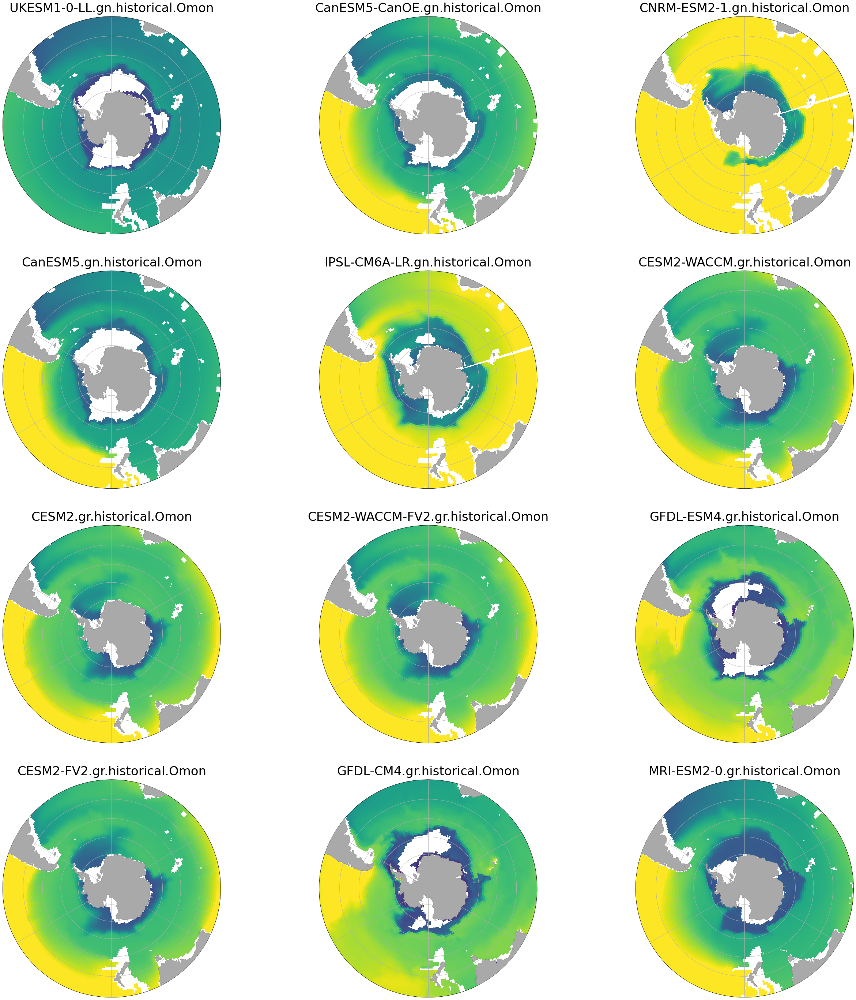

In [12]:


grid = Grid(ds, coords={'Z': {'center':'lev'}}, periodic=False)
target = np.linspace(35.5, 37, 10)

fig, axarr = plt.subplots(nrows = 4, ncols=3, figsize=[40,40], subplot_kw={'projection':ccrs.SouthPolarStereo()})
fig.tight_layout(pad = 5)
crs_plot = ccrs.SouthPolarStereo()
crs_source = ccrs.PlateCarree()

ax_idx = 0

for name, ds in dd.items():

    ax = axarr.flat[ax_idx]
    
    DIC = grid.transform(ds['dissic'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    TALK = grid.transform(ds['talk'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    THETAO = grid.transform(ds['thetao'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    P = grid.transform(ds['p'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    TEMP = grid.transform(ds['insitutemp'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    conversion =  1e6/1035
    results = pyco2.sys(par1=TALK*conversion,par2=DIC*conversion,par1_type=1,par2_type=2,
                    pressure_out=0, temperature_out = THETAO, pressure = P, 
                    temperature = TEMP)

    ppco2 = DIC.copy(data=results['pCO2_out'])

    ax = axarr.flat[ax_idx]
    ax.add_feature(cfeature.LAND,zorder=10,facecolor='darkgray')
    ax.set_extent([-180, 180, -90, -30], crs_source)
    # Compute a circle in axes coordinates, which we can use as a boundary
    # for the map. We can pan/zoom as much as we like - the boundary will be
    # permanently circular.
    
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    
    ax.gridlines()
    ax.coastlines()
    
    title=name
    ax.set_title(title,fontsize=34,pad = 12)
    
    lat = ds['dissic'].lat.transpose('y','x')
    lon = ds['dissic'].lon.transpose('y','x')
    X = lon
    Y = lat
    
    conversion = 3.1536e7 * 22.72
    # 3.1536e7 seconds per year
    # 22.72 mol CO2 per kg -- 44.01 gCO2/mol
    Z = ppco2.sel(sigma2 = 36.7,method='nearest')
#     rho = gsw.sigma2(ds['so'].so.isel(lev = 16),ds['thetao'].thetao.isel(lev = 16))
#     rho = rho.transpose('x','y')
#     rho.assign_coords({'lat': Y})
#     rho.assign_coords({'lon': X})
#     rho = rho.transpose('x','y')
#     rho.assign_coords({'lat': Y})
#     rho.assign_coords({'lon': X})
# #     rho = rho.transpose('y','x')
# #     print(Z)
# #     print(rho)
    
    
    im = ax.pcolormesh(X,Y,Z,cmap='viridis', transform = crs_source, shading = 'auto', vmin = 200, vmax = 550)
    
#     cbar_label = 'Surface Upward Flux of Total CO\u2082 (mol/m\u00b2/yr)'
#     cbar = plt.colorbar(im,ax = ax, orientation='horizontal',fraction = 0.05, pad=0.05)
#     cbar.set_label(cbar_label, fontsize = 20)
#     cbar.ax.tick_params(labelsize=18)

    
    ax_idx += 1



## PCO2 at 36.8 kg/m3

/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: Ru

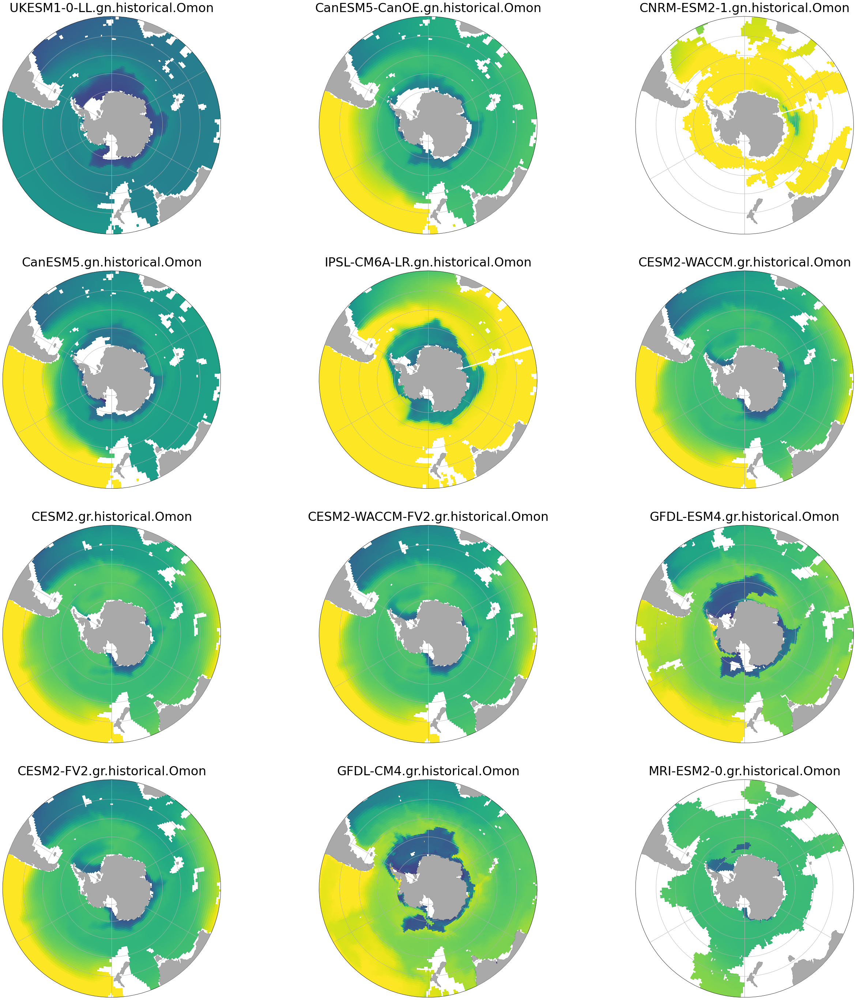

In [11]:


grid = Grid(ds, coords={'Z': {'center':'lev'}}, periodic=False)
target = np.linspace(35.5, 37, 10)

fig, axarr = plt.subplots(nrows = 4, ncols=3, figsize=[40,40], subplot_kw={'projection':ccrs.SouthPolarStereo()})
fig.tight_layout(pad = 5)
crs_plot = ccrs.SouthPolarStereo()
crs_source = ccrs.PlateCarree()

ax_idx = 0

for name, ds in dd.items():

    ax = axarr.flat[ax_idx]
    
    DIC = grid.transform(ds['dissic'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    TALK = grid.transform(ds['talk'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    THETAO = grid.transform(ds['thetao'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    P = grid.transform(ds['p'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    TEMP = grid.transform(ds['insitutemp'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    conversion =  1e6/1035
    results = pyco2.sys(par1=TALK*conversion,par2=DIC*conversion,par1_type=1,par2_type=2,
                    pressure_out=0, temperature_out = THETAO, pressure = P, 
                    temperature = TEMP)

    ppco2 = DIC.copy(data=results['pCO2_out'])

    ax = axarr.flat[ax_idx]
    ax.add_feature(cfeature.LAND,zorder=10,facecolor='darkgray')
    ax.set_extent([-180, 180, -90, -30], crs_source)
    # Compute a circle in axes coordinates, which we can use as a boundary
    # for the map. We can pan/zoom as much as we like - the boundary will be
    # permanently circular.
    
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    
    ax.gridlines()
    ax.coastlines()
    
    title=name
    ax.set_title(title,fontsize=34,pad = 12)
    
    lat = ds['dissic'].lat.transpose('y','x')
    lon = ds['dissic'].lon.transpose('y','x')
    X = lon
    Y = lat
    
    conversion = 3.1536e7 * 22.72
    # 3.1536e7 seconds per year
    # 22.72 mol CO2 per kg -- 44.01 gCO2/mol
    Z = ppco2.sel(sigma2 = 36.8,method='nearest')
#     rho = gsw.sigma2(ds['so'].so.isel(lev = 16),ds['thetao'].thetao.isel(lev = 16))
#     rho = rho.transpose('x','y')
#     rho.assign_coords({'lat': Y})
#     rho.assign_coords({'lon': X})
#     rho = rho.transpose('x','y')
#     rho.assign_coords({'lat': Y})
#     rho.assign_coords({'lon': X})
# #     rho = rho.transpose('y','x')
# #     print(Z)
# #     print(rho)
    
    
    im = ax.pcolormesh(X,Y,Z,cmap='viridis', transform = crs_source, shading = 'auto', vmin = 200, vmax = 550)
    
#     cbar_label = 'Surface Upward Flux of Total CO\u2082 (mol/m\u00b2/yr)'
#     cbar = plt.colorbar(im,ax = ax, orientation='horizontal',fraction = 0.05, pad=0.05)
#     cbar.set_label(cbar_label, fontsize = 20)
#     cbar.ax.tick_params(labelsize=18)

    
    ax_idx += 1



## PCO2 at 36.6 kg/m3

/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: RuntimeWarning: invalid value encountered in _interp_1d_linear
  return self.ufunc(*args, **kwargs)
/srv/conda/envs/notebook/lib/python3.8/site-packages/numba/np/ufunc/gufunc.py:151: Ru

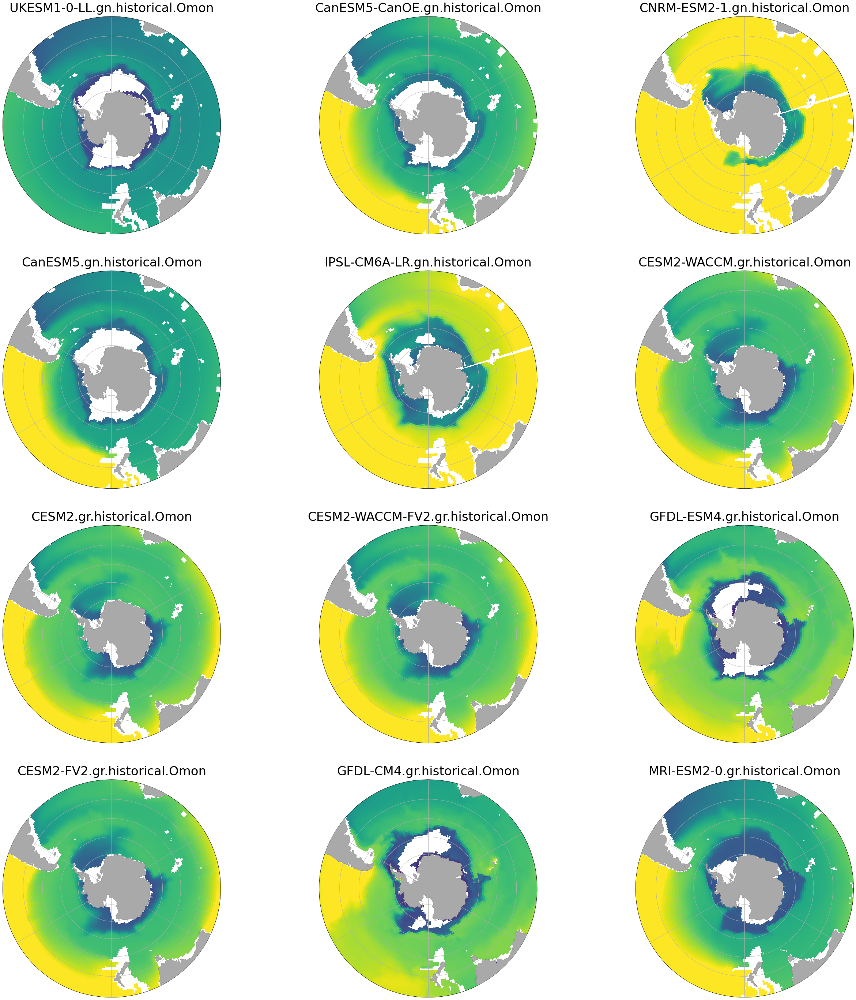

In [10]:


grid = Grid(ds, coords={'Z': {'center':'lev'}}, periodic=False)
target = np.linspace(35.5, 37, 10)

fig, axarr = plt.subplots(nrows = 4, ncols=3, figsize=[40,40], subplot_kw={'projection':ccrs.SouthPolarStereo()})
fig.tight_layout(pad = 5)
crs_plot = ccrs.SouthPolarStereo()
crs_source = ccrs.PlateCarree()

ax_idx = 0

for name, ds in dd.items():

    ax = axarr.flat[ax_idx]
    
    DIC = grid.transform(ds['dissic'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    TALK = grid.transform(ds['talk'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    THETAO = grid.transform(ds['thetao'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    P = grid.transform(ds['p'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    TEMP = grid.transform(ds['insitutemp'], 'Z', target, target_data=ds['sigma2'], method = 'linear').transpose('sigma2','y', 'x')
    conversion =  1e6/1035
    results = pyco2.sys(par1=TALK*conversion,par2=DIC*conversion,par1_type=1,par2_type=2,
                    pressure_out=0, temperature_out = THETAO, pressure = P, 
                    temperature = TEMP)

    ppco2 = DIC.copy(data=results['pCO2_out'])

    ax = axarr.flat[ax_idx]
    ax.add_feature(cfeature.LAND,zorder=10,facecolor='darkgray')
    ax.set_extent([-180, 180, -90, -30], crs_source)
    # Compute a circle in axes coordinates, which we can use as a boundary
    # for the map. We can pan/zoom as much as we like - the boundary will be
    # permanently circular.
    
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    
    ax.gridlines()
    ax.coastlines()
    
    title=name
    ax.set_title(title,fontsize=34,pad = 12)
    
    lat = ds['dissic'].lat.transpose('y','x')
    lon = ds['dissic'].lon.transpose('y','x')
    X = lon
    Y = lat
    
    conversion = 3.1536e7 * 22.72
    # 3.1536e7 seconds per year
    # 22.72 mol CO2 per kg -- 44.01 gCO2/mol
    Z = ppco2.sel(sigma2 = 36.6,method='nearest')
#     rho = gsw.sigma2(ds['so'].so.isel(lev = 16),ds['thetao'].thetao.isel(lev = 16))
#     rho = rho.transpose('x','y')
#     rho.assign_coords({'lat': Y})
#     rho.assign_coords({'lon': X})
#     rho = rho.transpose('x','y')
#     rho.assign_coords({'lat': Y})
#     rho.assign_coords({'lon': X})
# #     rho = rho.transpose('y','x')
# #     print(Z)
# #     print(rho)
    
    
    im = ax.pcolormesh(X,Y,Z,cmap='viridis', transform = crs_source, shading = 'auto', vmin = 200, vmax = 550)
    
#     cbar_label = 'Surface Upward Flux of Total CO\u2082 (mol/m\u00b2/yr)'
#     cbar = plt.colorbar(im,ax = ax, orientation='horizontal',fraction = 0.05, pad=0.05)
#     cbar.set_label(cbar_label, fontsize = 20)
#     cbar.ax.tick_params(labelsize=18)

    
    ax_idx += 1



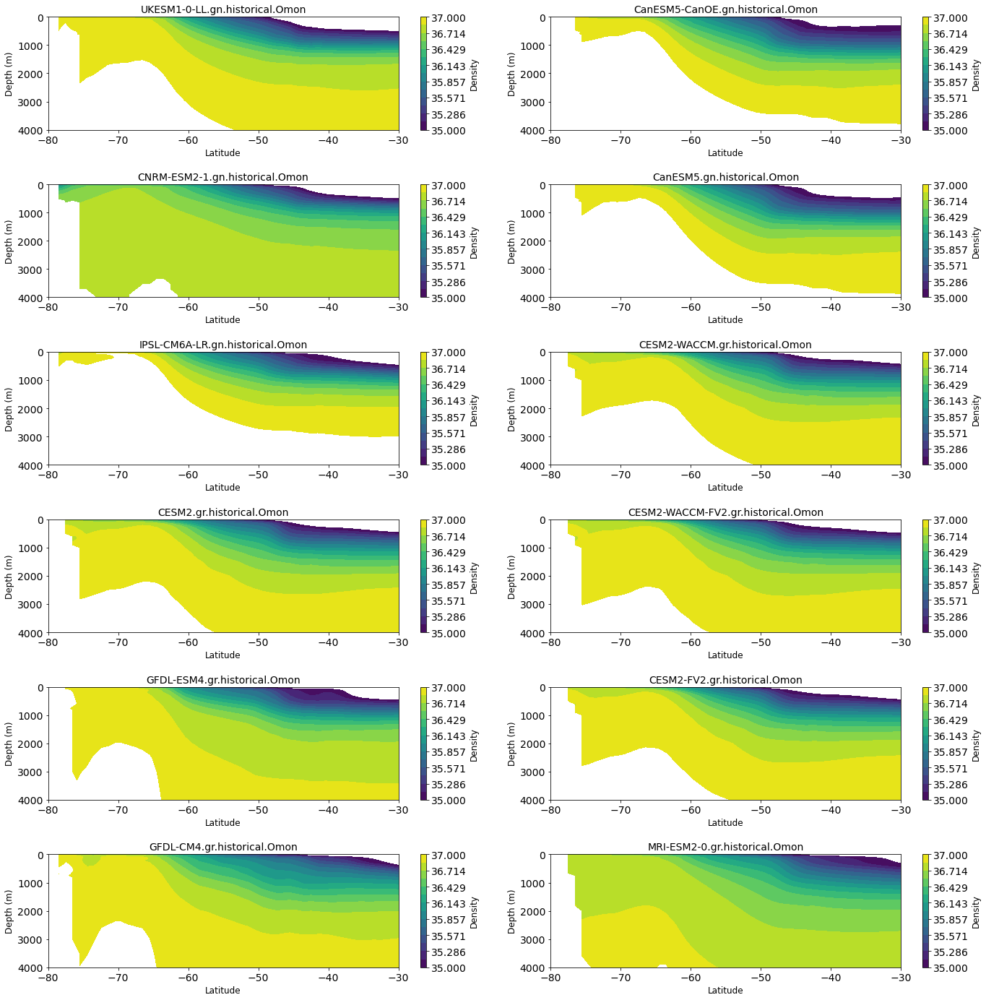

In [16]:
fig, axarr = plt.subplots(nrows = 6, ncols = 2, figsize=[20,20])
fig.tight_layout(pad = 3.5)
plt.rc('font', size = 14)
plt.rc('axes', titlesize= 14)    
plt.rc('axes', labelsize= 12)
plt.rc('figure', titlesize=16)

target = np.linspace(35, 37, 15)

ax_idx = 0
for name, ds in dd_x.items():
    ax = axarr.flat[ax_idx]
    conversion =  1e6/1035
#     results = pyco2.sys(par1=ds['talk']*conversion,par2=ds['dissic']*conversion,par1_type=1,par2_type=2,
#                         pressure_out=0, temperature_out = ds['thetao'], pressure = ds['p'], 
#                         temperature = ds['insitutemp'])
    ax.set_xlim([-80,-30])
    ax.set_ylim([0,4000])
    im = ax.contourf(ds['y'],ds['lev'], ds['sigma2'], levels = target)
#     CS = ax.contour(ds['y'],ds['lev'],ds['sigma2'],levels=[36, 36.5, 36.75, 37], colors = 'w')
    cbar = plt.colorbar(im,ax=ax)
    ax.invert_yaxis()
    cbar.set_label('Density')
    ax.set_title(name)
    ax.set_xlabel('Latitude')
    ax.set_ylabel('Depth (m)')
    ax_idx += 1

In [20]:
ds = dd['UKESM1-0-LL.gn.historical.Omon']
binz = np.linspace(35.5, 37, 15)
h = histogram(ds['sigma2'].isel(lev = 0), bins = [binz], weights = 1*ds.fgco2) 
#               weights = ds.fgco2.transpose('x','y').fillna(0).dot(A.areacello.fillna(0)))
#               * ds['fgco2'].transpose('x','y'))

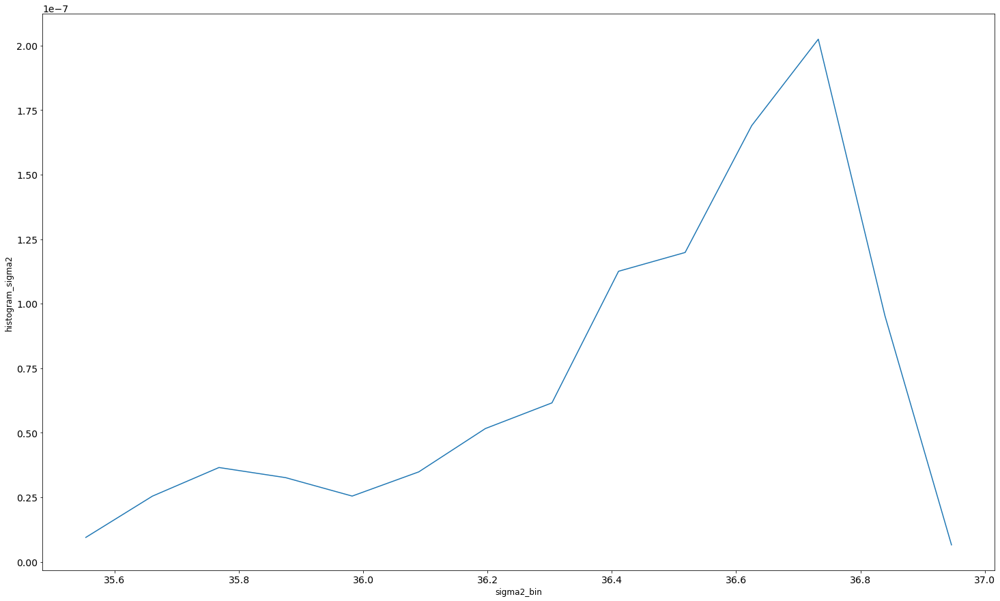

In [19]:
h.plot()
# h

In [8]:
ds = dd['GFDL-CM4.gr.historical.Omon']
binz = np.linspace(35.5, 37, 15)
h2 = histogram(ds['sigma2'].isel(lev = 0), bins = [binz], weights = ds.fgco2*A.areacello) 
#               weights = ds.fgco2.transpose('x','y').fillna(0).dot(A.areacello.fillna(0)))
#               * ds['fgco2'].transpose('x','y'))

ValueError: indexes along dimension 'y' are not equal

In [26]:
h2

<xarray.DataArray 'histogram_sigma2' (sigma2_bin: 14)>
dask.array<getitem, shape=(14,), dtype=float64, chunksize=(14,), chunktype=numpy.ndarray>
Coordinates:
  * sigma2_bin  (sigma2_bin) float64 35.55 35.66 35.77 ... 36.73 36.84 36.95

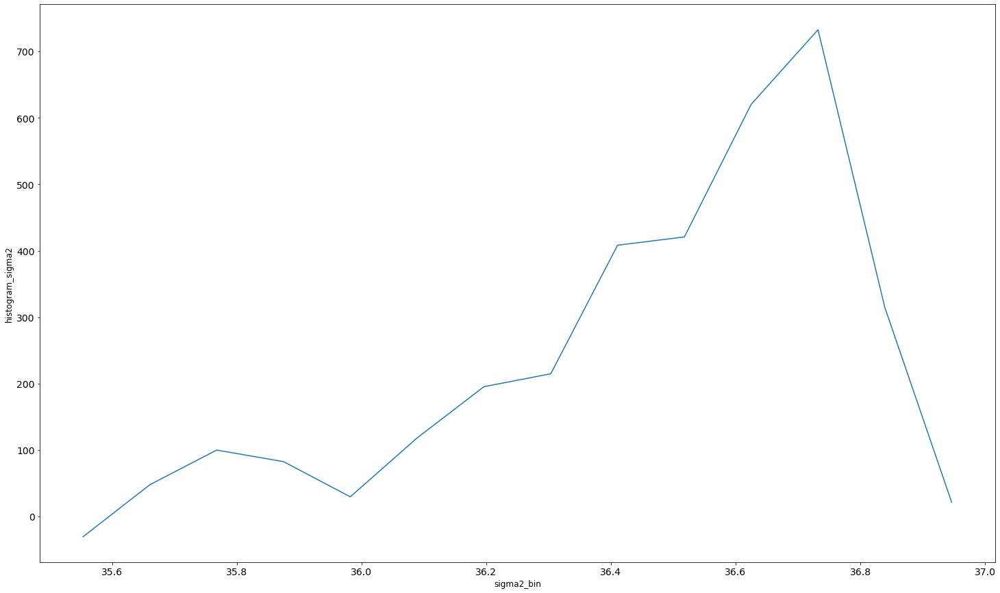

In [19]:
h2.plot()

I'm not sure this histogram is reflecting where CO2 is in-gassed and where Co2 is outgassed. It is either always positive or always negative in the histogram but tha tis not true 

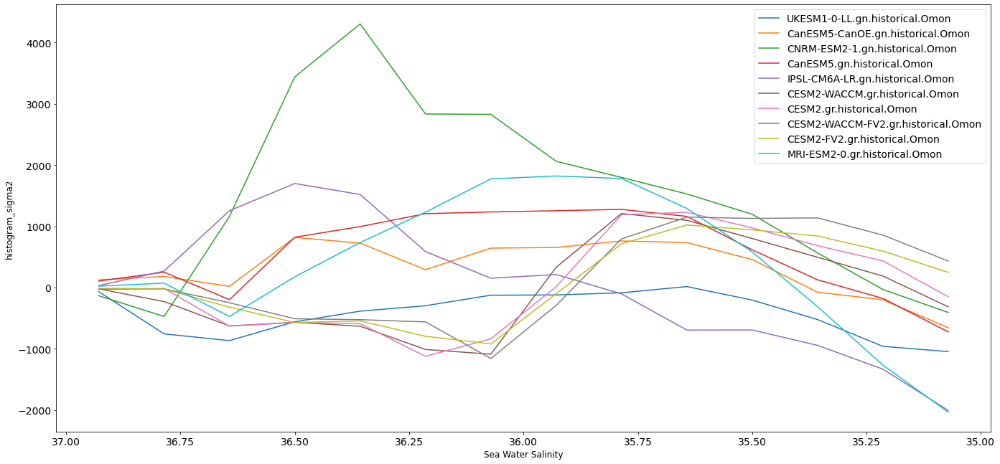

In [141]:
fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize=[20,10])
fig.tight_layout(pad = 3.5)
plt.rc('font', size = 14)
plt.rc('axes', titlesize= 14)    
plt.rc('axes', labelsize= 12)
plt.rc('figure', titlesize=16)

target = np.linspace(35, 37, 15)
binz = np.linspace(35, 37, 15)

ax_idx = 0
for name, ds in dd.items():
    if name != 'GFDL-ESM4.gr.historical.Omon':
        if name != 'GFDL-CM4.gr.historical.Omon':
            h2 = histogram(ds['sigma2'].isel(lev = 0), bins = [binz], weights = -1*ds.fgco2*A.areacello) 
            h2.plot(label = name)
ax.invert_xaxis()
plt.legend(
#     bbox_to_anchor=(1.05, 1), 
    loc='upper right'
#     , borderaxespad=0.
)

In [ ]:
# reverse the x-axis